This notebook presents our project, which focuses on processing PDFs and extracting figures and tables from them. Our base framework is [Docling](https://github.com/DS4SD/docling) (we experimented with various alternatives such as Unstructured, Grobid, MinerU, and many others, but Docling proved to be the best). Docling combines OCR, a transformer-based model for object detection and layout analysis (RT-DETR), and a table parsing model (TableFormer). Since our emphasis is on images with text, we filter out images that do not contain text. Currently, we use a simple method based on OCR for this filtering, but we also plan to incorporate an image classifier specifically designed for scientific figures and tables.

We also support extracting tables in structured formats (Markdown, HTML, JSON), obtaining the coordinates of the images, generating an annotated PDF, creating a profile/metadata of the PDF that stores the coordinates of various elements, and extracting captions when available. Additionally, we retrieve relevant passages (using semantic chunking of PDF's text with [BGE](https://huggingface.co/BAAI/bge-small-en-v1.5) embeddings and map the most relevant chunks to images via multimodal embeddings from [nomic](https://huggingface.co/nomic-ai/nomic-embed-text-v1.5)). We generate descriptions using MLM, supporting both [Qwen2.5-VL-3B-Instruct](https://huggingface.co/Qwen/Qwen2.5-VL-3B-Instruct) and Deepseek's [Janus-Pro-1B](https://huggingface.co/deepseek-ai/Janus-Pro-1B).

Our plan, besides building the PDF profiler based on figures and tables, is to develop indexes that efficiently retrieve relevant tables and images given a query figure or table. To this end, we have implemented interfaces for various indexes based on pre-trained models:
- Microsoft's [ResNet](https://huggingface.co/microsoft/resnet-50)
- Jina's [CLIP](jinaai/jina-clip-v2)
- [ColPali](https://github.com/illuin-tech/colpali)

We store both figures and tables in the same format as images, as we believe this is a lossless approach. Moreover, we anticipate that multimodal models (which process both text and images), such as CLIP and ColPali, will outperform simpler models like ResNet when dealing with text-based images, as they offer a better semantic understanding. Specifically, while ColPali is trained on images of PDF pages, we believe its embeddings will perform exceptionally well for our task. Therefore, we have extended its basic functionality (which originally only supported text-to-image retrieval) to also support image-to-image retrieval within the same vector space. We will experiment with all the indexes and, for the multimodal ones, explore different retrieval methods.

To build our dataset, we have already downloaded and stored a selection of random computer science papers from arXiv and augmented them with additional Text-to-SQL-specific papers. We will use a Text-to-SQL PDF as our query document, and we expect our system to retrieve relevant Text-to-SQL images.


In [1]:
import os
import json
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from utils.PDFSerlalizer import DocumentHandler
from utils.ImageIndexer import CLIPIndexer,ResNetIndexer,ColpaliIndexer

/home/akouk/miniconda3/envs/qwen_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Python version is above 3.10, patching the collections module.


/home/akouk/miniconda3/envs/qwen_env/lib/python3.10/site-packages/transformers/models/auto/image_processing_auto.py:592: FutureWarning: The image_processor_class argument is deprecated and will be removed in v4.42. Please use `slow_image_processor_class`, or `fast_image_processor_class` instead
  warnings.warn(


Initialize directories

In [2]:
PDF_FOLDER = './pdfs'
IMAGE_FOLDER = './temp/images'
INDEX_FOLDER = './temp/index'
os.makedirs(IMAGE_FOLDER, exist_ok=True)
os.makedirs(INDEX_FOLDER, exist_ok=True)

INDEXER_CACHE = {}

In [3]:
document_handler = DocumentHandler()


In [ ]:
def process_pdfs():
    """Process all PDFs in the PDF_FOLDER and extract images"""
    for filename in os.listdir(PDF_FOLDER):
        if filename.lower().endswith('.pdf'):
            try:
                pdf_path = os.path.join(PDF_FOLDER, filename)                
                result = document_handler.extract_images(
                    pdf_path=pdf_path,
                    output_folder=IMAGE_FOLDER,
                    export_pages=False,
                )

            except Exception as e:
                print(f"Error processing {filename}: {str(e)}")

        
process_pdfs()

The above cell will store the images to the specified output folder. We will now index them.

In [4]:
def create_indexes(index_types=['colpali','clip', 'resnet']):
    """Create search indexes for extracted images"""
    for index_name in index_types:
        try:
            index_folder = os.path.join(INDEX_FOLDER, index_name)
            os.makedirs(index_folder, exist_ok=True)
            print(f"Creating {index_name} index...")
            
            if index_name == 'clip':
                indexer = CLIPIndexer(index_folder)
            elif index_name == 'resnet':
                indexer = ResNetIndexer(index_folder)
            elif index_name == 'colpali':
                indexer = ColpaliIndexer(index_folder)
            
            indexer.create_index(IMAGE_FOLDER)
            
        except Exception as e:
            print(f"{index_name} indexing failed: {str(e)}")

create_indexes()

Creating colpali index...


Loading checkpoint shards: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]


overwrite is on. Deleting existing index pdfs_images to build a new one.
Indexing file: temp/images/SQLPrompt In-Context Text-to-SQL with Minimal Labeled Data (1)-table-3.png
Indexing file: temp/images/2204.02283-picture-16.png
Indexing file: temp/images/2201.09736-picture-2.png
Indexing file: temp/images/2204.02283-picture-9.png
Indexing file: temp/images/2112.02817-picture-25.png
Indexing file: temp/images/2024-09-chase-sql-picture-1.png
Indexing file: temp/images/2112.03404-table-4.png
Indexing file: temp/images/2112.02817-picture-21.png
Indexing file: temp/images/2204.10959-picture-6.png
Indexing file: temp/images/2203.02158-picture-8.png
Indexing file: temp/images/2112.02817-picture-20.png
Indexing file: temp/images/2112.06433-picture-1.png
Indexing file: temp/images/2204.02283-table-7.png
Indexing file: temp/images/2205.10016-picture-8.png
Indexing file: temp/images/codes-table-7.png
Indexing file: temp/images/2201.09736-picture-12.png
Indexing file: temp/images/2206.02593-pictur

Generating embeddings: 100%|██████████| 549/549 [01:38<00:00,  5.56it/s]


Creating clip index...


/home/akouk/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:175: UserWarning: xFormers is not installed. Check https://github.com/facebookresearch/xformers?tab=readme-ov-file#installing-xformers for installation instructions, disabling
  warnings.warn(
/home/akouk/miniconda3/envs/qwen_env/lib/python3.10/site-packages/flash_attn/ops/triton/layer_norm.py:985: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  def forward(
/home/akouk/miniconda3/envs/qwen_env/lib/python3.10/site-packages/flash_attn/ops/triton/layer_norm.py:1044: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  def backward(ctx, dout, *args):
Indexing images: 100%|██████████| 138/138 [00:33<00:00,  4.16it/s]


Creating resnet index...


Indexing images: 100%|██████████| 549/549 [00:06<00:00, 79.75it/s]


In [5]:
QUERY_PDF = './query.pdf'
QUERY_DATA = './query_data'
os.makedirs(QUERY_DATA, exist_ok=True)

Get the images from the query pdf. We will for now use deepseek to generate the description. 

In [9]:
query_result = document_handler.extract_images(
    pdf_path=QUERY_PDF,
    output_folder=QUERY_DATA,
    verbose=False,
    export_tables=True,
    export_figures=True,
    export_pages=False,
    do_ocr=True,
    do_table_structure=True,
    filter_irrelevant=True,
    add_caption=True,
    generate_metadata=True,
    generate_annotated_pdf=True,
    generate_descriptions=True,
    description_model="deepseek",
    generate_table_markdown=True,
    relevant_passages=2
)

Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for

Now we will display some of the images and their metadata that are relevant to the retrieval process.

Select an image for searching:

[1] The figure illustrates a three-stage paradigm for SOTA-based Text2SQL, highlighting the distribution of error types, cross-consistency metrics, and the effectiveness of the proposed scheme in reducing hallucinations.
Type: picture


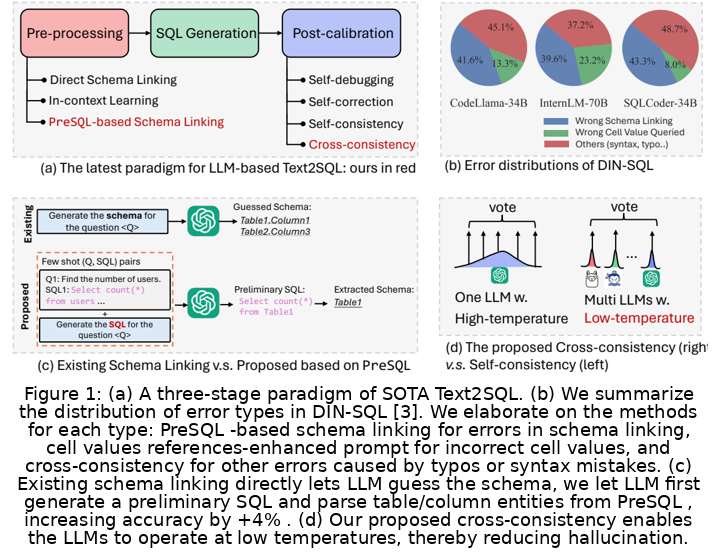


[2] The figure illustrates a visualization of the performance of a proposed Prompt-Based Schema linking scheme for parsing SQL queries, highlighting its effectiveness in reducing the prompt length by 35% and improving the text2sql accuracy by 2%.
Type: picture


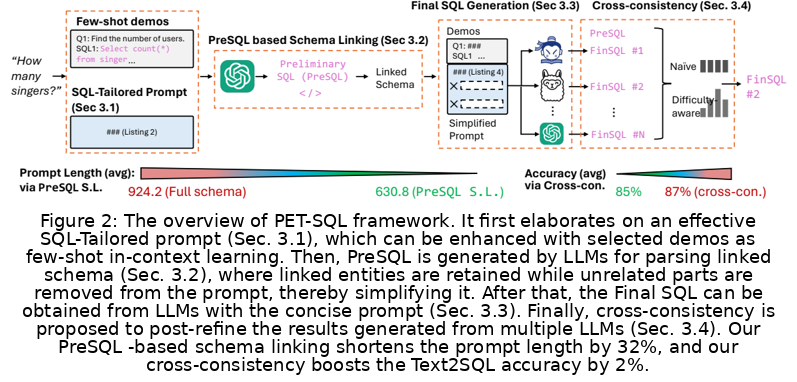


[3] The figure illustrates a type of visualization used in machine learning, specifically a "Demonstration Format" for demonstrating the performance of a neural network model. The main concept is the accuracy of a model in predicting a target variable, with the "SELECT count" operation used to count the number of correct predictions.
Type: picture


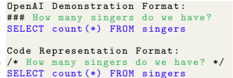


[4] The figure illustrates a visualization of a scientific paper's key findings, focusing on the optimization of a model's execution time while maintaining accuracy, the identification of a singer in a dataset, and the use of cell value references in cell-based data analysis.
Type: picture


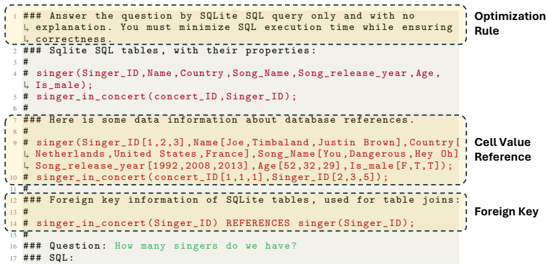


[5] The figure illustrates a "Schema Parsing" process using Natural Language Processing (NLP) to extract information from a scientific document, focusing on the number of authors, books, and actors, which are crucial for database indexing and retrieval.
Type: picture


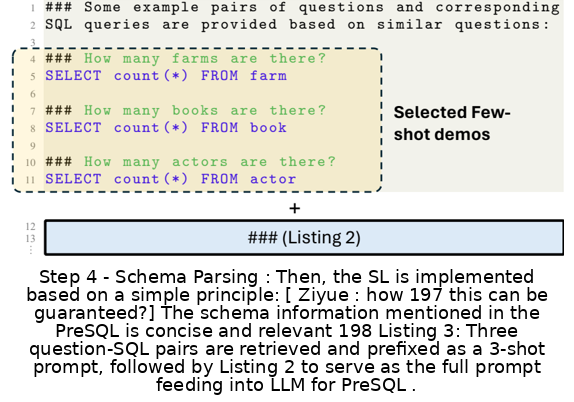


[6] The table presents the performance of a leaderboard for a spider-related task, highlighting the effectiveness of different methods in terms of accuracy and self-consistency.
Type: table
| Methods                                 | EX    |
|-----------------------------------------|-------|
| RESDSQL-3B + NatSQL [35]                | 79.9% |
| C3 + ChatGPT + Zero-Shot [5]            | 82.3% |
| DIN-SQL + GPT-4 [3]                     | 85.3% |
| DAIL-SQL + GPT-4 + Self-consistency [4] | 86.6% |
| PET-SQL (Naive voting)                  | 86.7% |
| PET-SQL (Difficulty-aware voting)       | 87.6% |


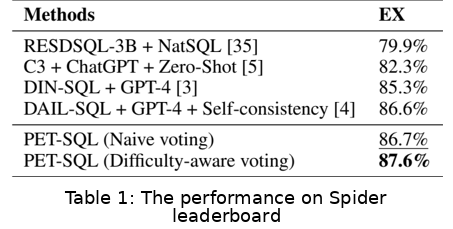


[7] The table presents a comparative analysis of three methods for visualizing data, highlighting their performance metrics and the specific datasets used.
Type: table
| Datasets    | Methods              |   CodeLlama-34B |   SQLCoder-34B |   InternLM-70B |
|-------------|----------------------|-----------------|----------------|----------------|
| Spider-dev  | DIN-SQL [3]          |           0.673 |          0.678 |          0.686 |
| Spider-dev  | DAIL-SQL [4]         |           0.756 |          0.709 |          0.742 |
| Spider-dev  | PET-SQL (w/o SL, CC) |           0.75  |          0.709 |          0.75  |
| Spider-test | DIN-SQL [3]          |           0.638 |          0.626 |          0.672 |
| Spider-test | DAIL-SQL [4]         |           0.72  |          0.697 |          0.707 |
| Spider-test | PET-SQL (w/o SL, CC) |           0.744 |          0.741 |          0.714 |


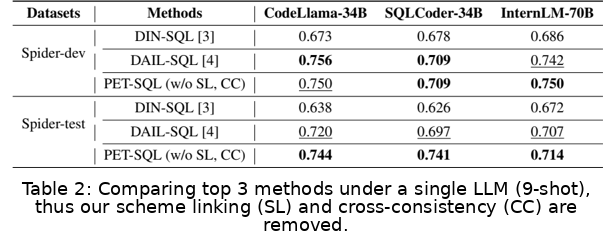


[8] The table presents the ablation study of the RE p on Spider-dev set, focusing on the full RE B highlight in boldface, the most important component in boldface, and the lowest EXI, highlighting its significance.
Type: table
|        | CodeLlama-34B   | SQLCoder-34B   | InternLM-70B   |
|--------|-----------------|----------------|----------------|
| RE p   | 73.80%          | 65.70%         | 70.70%         |
| w/o OR | 71.50%          | 64.60%         | 69.90%         |
| w/o CV | 71.30%          | 61.70%         | 69.10%         |
| w/o FK | 66.30%          | 62.30%         | 71.60%         |


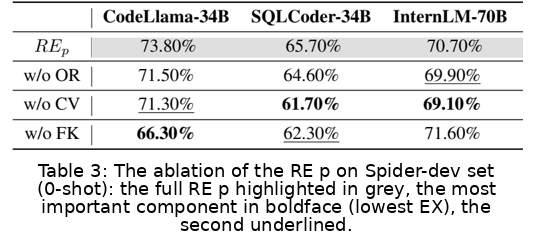


[9] The table presents a comparative analysis of linking schemes between Demo-fixed SL and PreSQL-based SL for the Spider dataset, focusing on their performance based on table recall metrics.
Type: table
| Datasets    | SL Methods       | CodeLlama-34B   | CodeLlama-34B   | SQLCoder-34B   | SQLCoder-34B   | InternLM-70B   | InternLM-70B   |
|-------------|------------------|-----------------|-----------------|----------------|----------------|----------------|----------------|
|             | SL Methods       | R e             | R s             | R e            | R s            | R e            | R s            |
| Spider-dev  | Demo-fixed SL    | 0.804           | 0.935           | 0.815          | 0.946          | 0.676          | 0.941          |
| Spider-dev  | PreSQL -based SL | 0.864           | 0.931           | 0.856          | 0.967          | 0.801          | 0.846          |
| Spider-test | Demo-fixed SL    | 0.802           | 0.927           | 0.790          | 0.919       

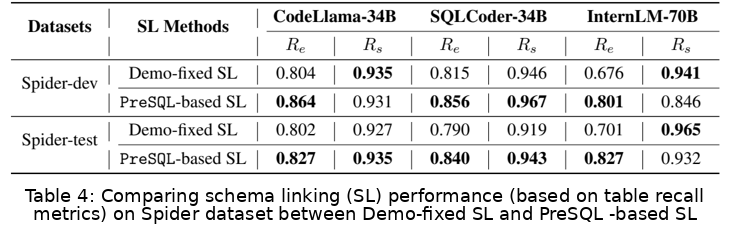

In [10]:
from IPython.display import Image, display

with open(os.path.join(QUERY_DATA, 'metadata.json')) as f:
    query_metadata = json.load(f)

print("Select an image for searching:")
for idx, item in enumerate(query_metadata, 1):
    if idx == 10 :
        break
    print(f"\n[{idx}] {item.get('description', 'No caption')}")
    print(f"Type: {item['type']}")
    if item['type'] == 'table':
        print(item['markdown'])
    display(Image(filename=os.path.join(QUERY_DATA, item['filename'])))

selected_idx = int(input("\nEnter image number to search: ")) - 1
selected_item = query_metadata[selected_idx]

In [11]:
def search_similar(image_path, index_type='clip', query_type='image', query_text=None, top_k=3):
    """Search for similar images/text"""
    index_type = index_type.lower()
    index_folder = os.path.join(INDEX_FOLDER, index_type)
    
    if index_type not in INDEXER_CACHE:
        if index_type == 'clip':
            INDEXER_CACHE[index_type] = CLIPIndexer(index_folder)
        elif index_type == 'resnet':
            INDEXER_CACHE[index_type] = ResNetIndexer(index_folder)
        elif index_type == 'colpali':
            INDEXER_CACHE[index_type] = ColpaliIndexer(index_folder)
        else:
            raise ValueError("Invalid index type")
    
    indexer = INDEXER_CACHE[index_type]
    
    if query_type == 'text':
        if not query_text:
            raise ValueError("Query text required for text search")
        return indexer.query_by_text(query_text, top_k=top_k)
    else:
        return indexer.query_by_image(image_path, top_k=top_k)


Try all different indexes and methods to query them, for tables we also use the markdown format.

In [12]:
def perform_comprehensive_search(query_item):
    results = {}
    query_image = os.path.join(QUERY_DATA, query_item['filename'])
    results['ColPali_image'] = search_similar(query_image, 'colpali', 'image')
    results['ColPali_description'] = search_similar(None, 'colpali', 'text', str(query_item['description']))
    if query_item.get('markdown'):
        results['ColPali_markdown'] = search_similar(None, 'colpali', 'text', query_item['markdown'])
        
        
    results['CLIP_image'] = search_similar(query_image, 'clip', 'image')
    results['CLIP_description'] = search_similar(None, 'clip', 'text', query_item['description'])
    if query_item.get('markdown'):
        results['CLIP_markdown'] = search_similar(None, 'clip', 'text', query_item['markdown'])
        
    results['ResNet_image'] = search_similar(query_image, 'resnet', 'image')
    
    return results


In [13]:
search_results = perform_comprehensive_search(selected_item)

Verbosity is set to 1 (active). Pass verbose=0 to make quieter.


Loading checkpoint shards: 100%|██████████| 2/2 [00:01<00:00,  1.03it/s]
/home/akouk/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:175: UserWarning: xFormers is not installed. Check https://github.com/facebookresearch/xformers?tab=readme-ov-file#installing-xformers for installation instructions, disabling
  warnings.warn(


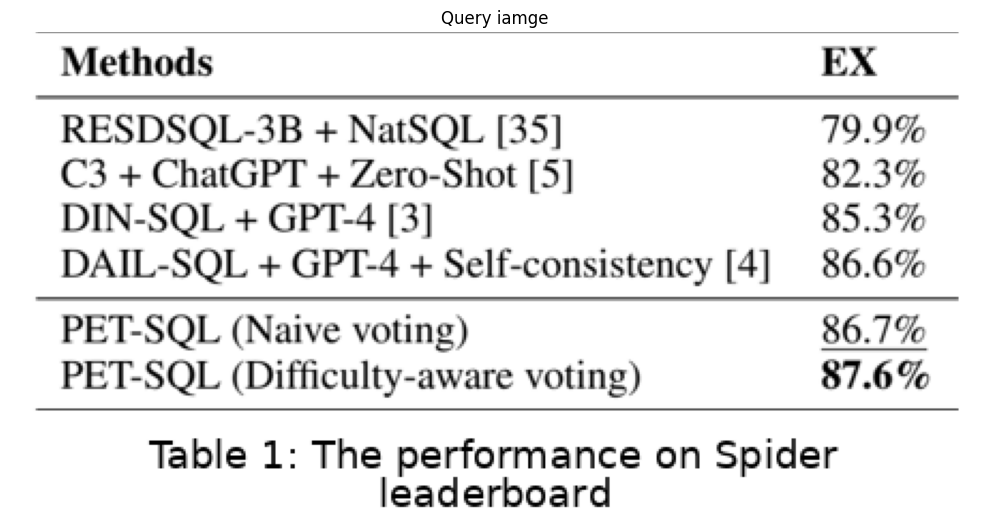

In [14]:
import matplotlib.pyplot as plt
from PIL import Image

query_image = os.path.join(QUERY_DATA, selected_item['filename'])
plt.figure(figsize=(10, 10))  # Adjust size as needed
plt.imshow(Image.open(query_image))
plt.title(f"Query iamge")
plt.axis('off')
plt.tight_layout()

Spider is a well-know dataset in Text-to-SQL so we use a table evaluating on it as the query image and expect to retrieve relevant images. Lets display the retrieved images (we only retrieve the 3 most relevant image per index so not to make the notebook too large)

Results from ColPali_image


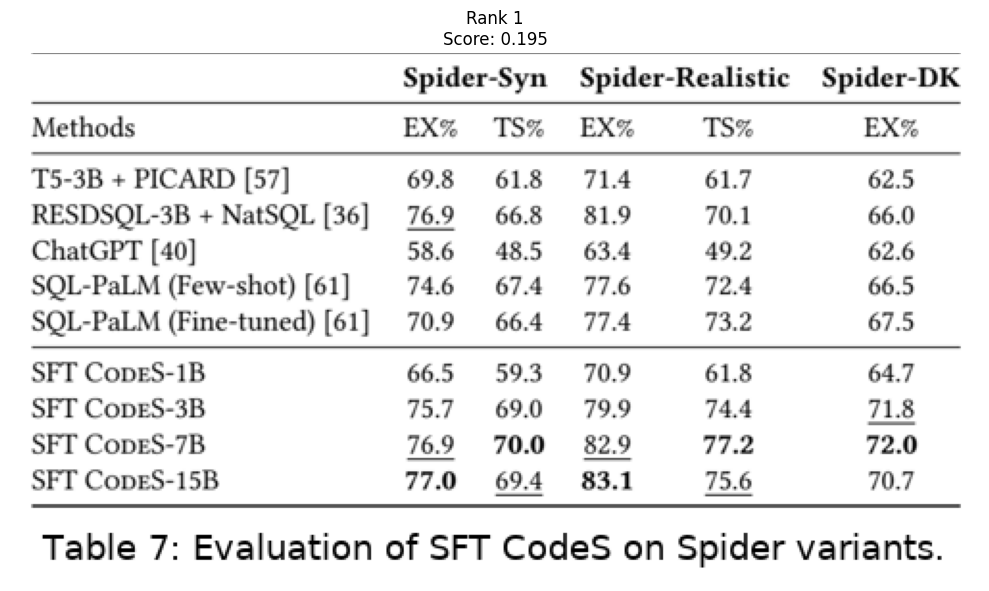

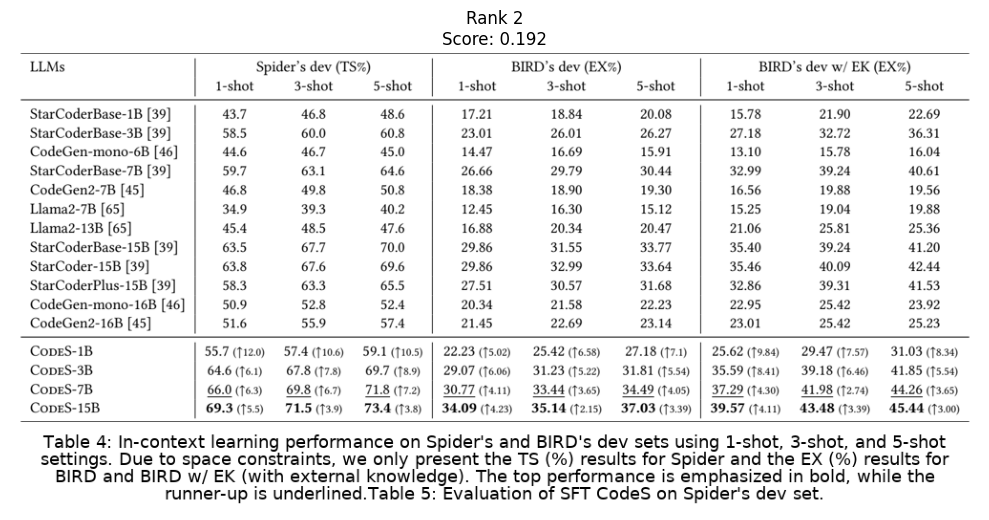

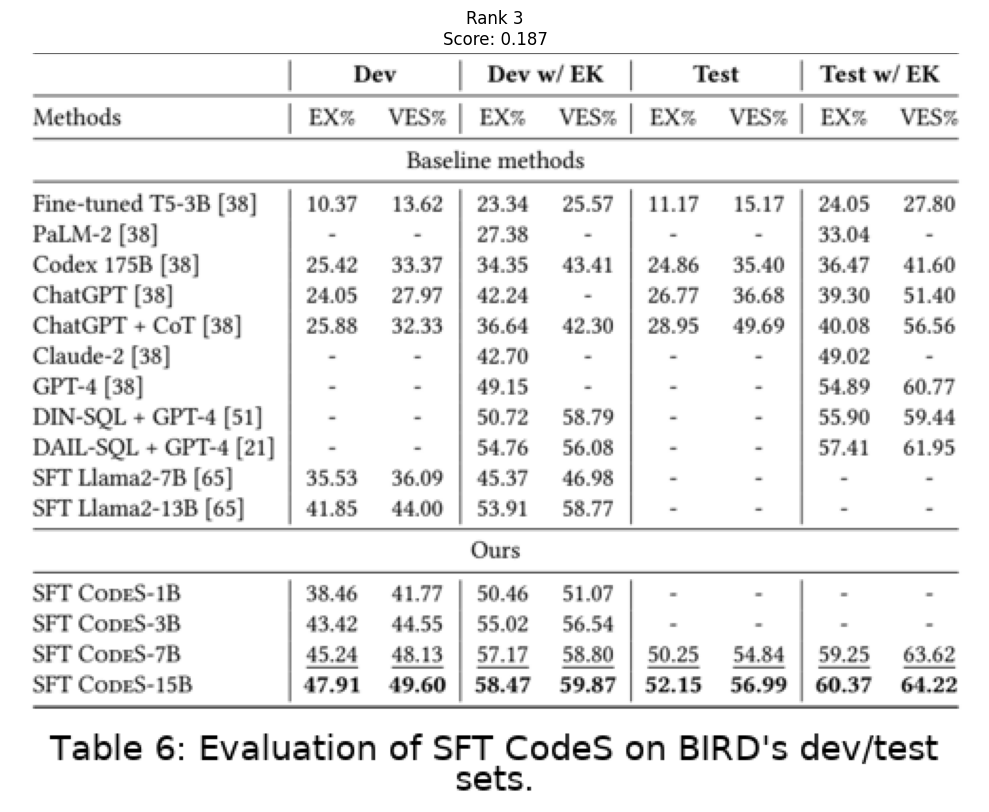

Results from ColPali_description


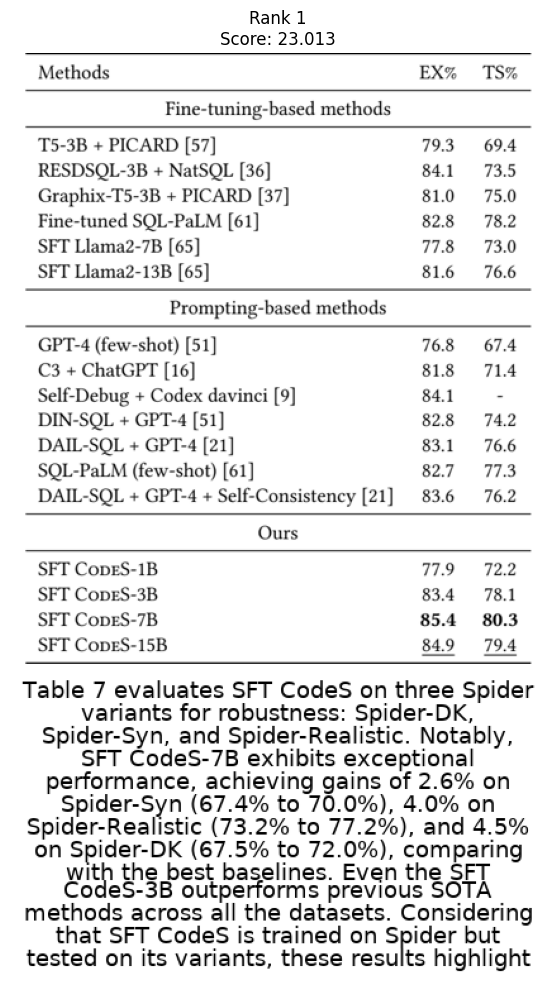

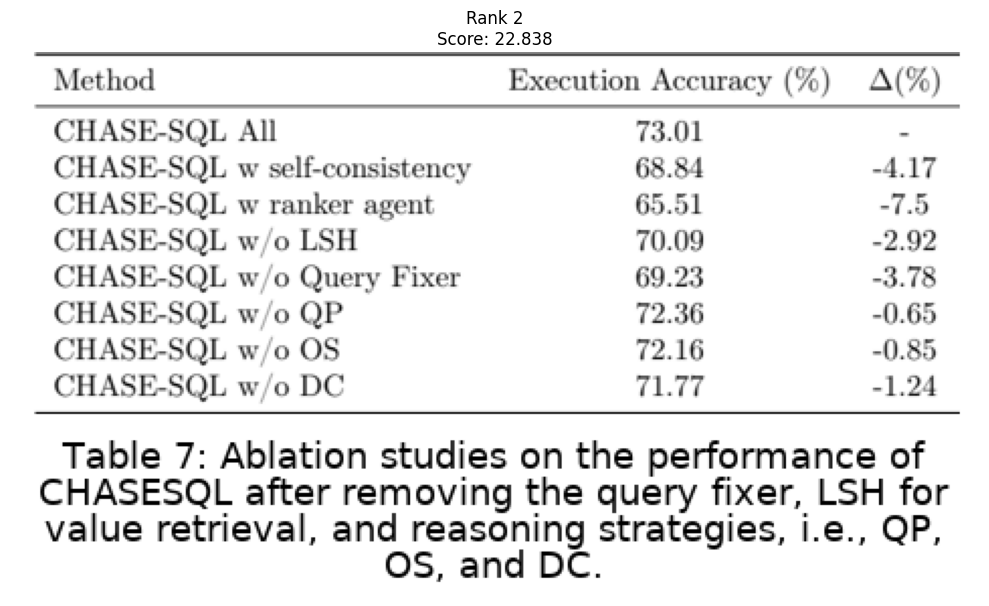

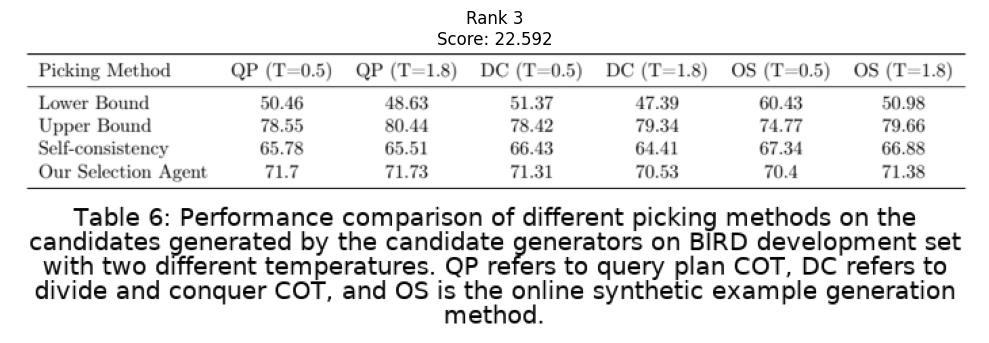

Results from ColPali_markdown


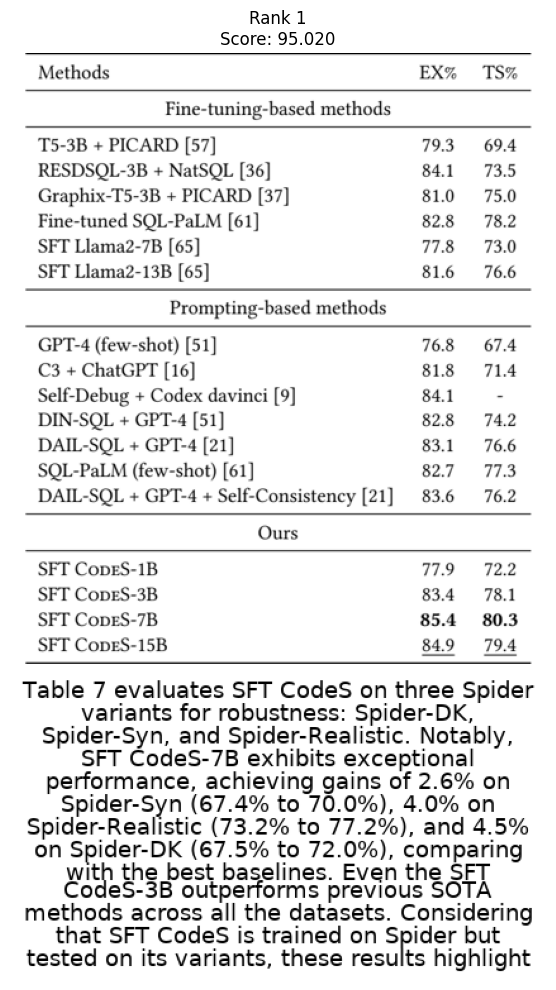

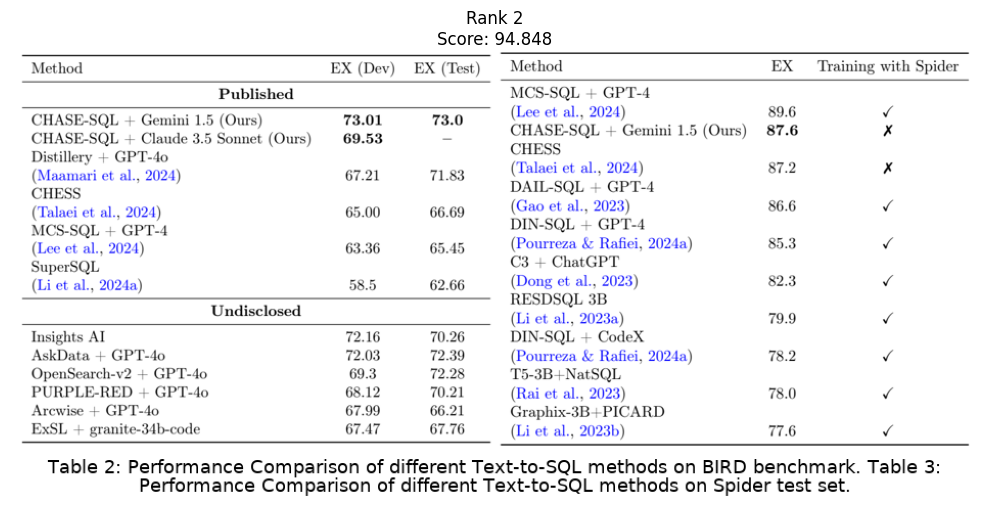

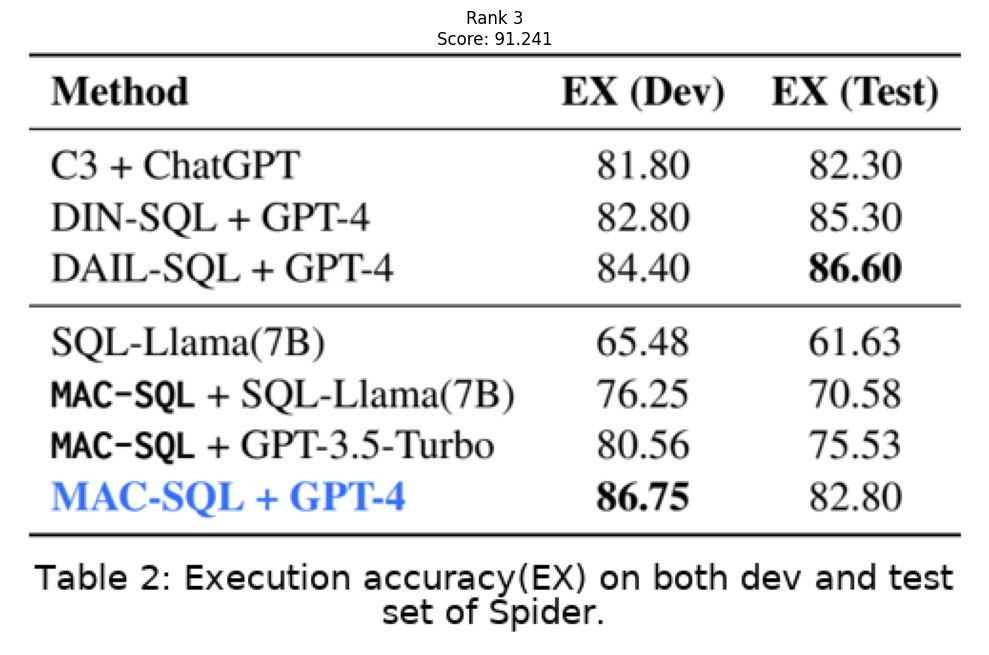

Results from CLIP_image


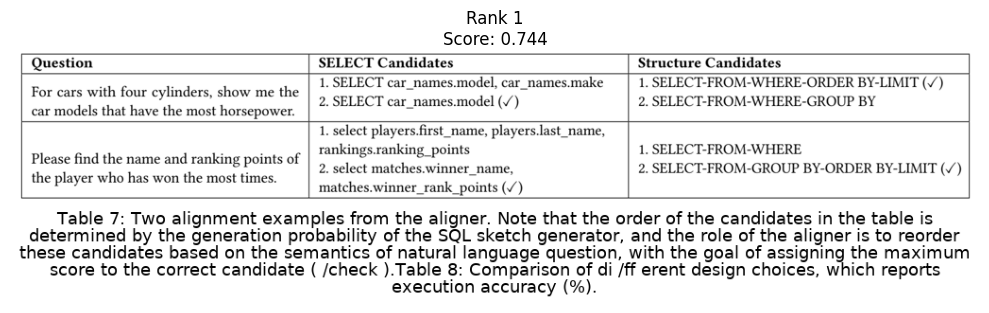

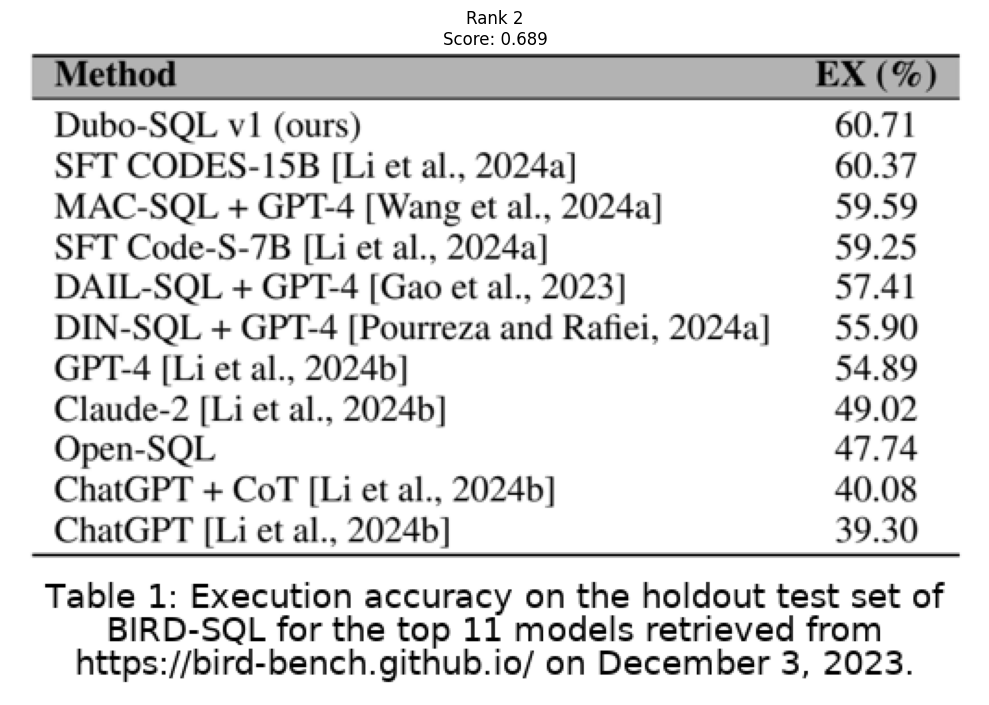

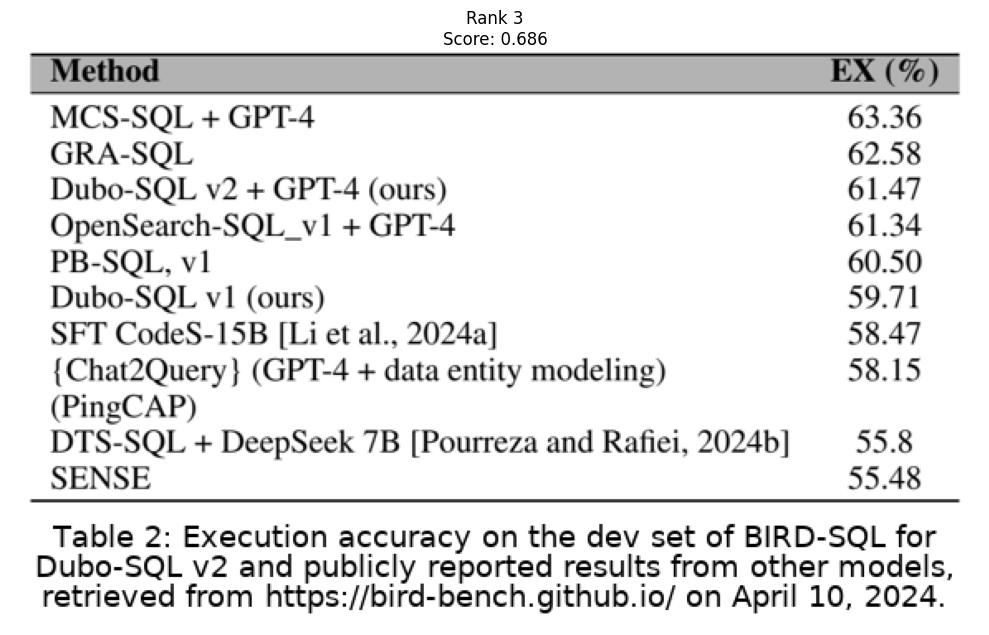

Results from CLIP_description


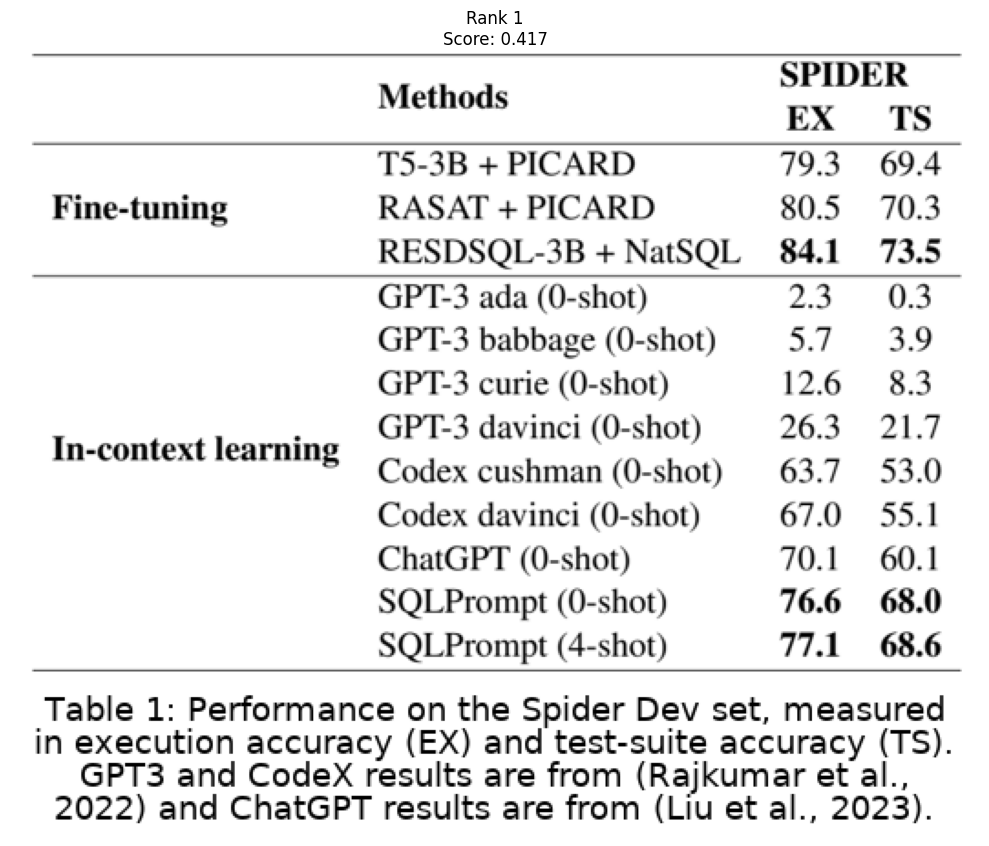

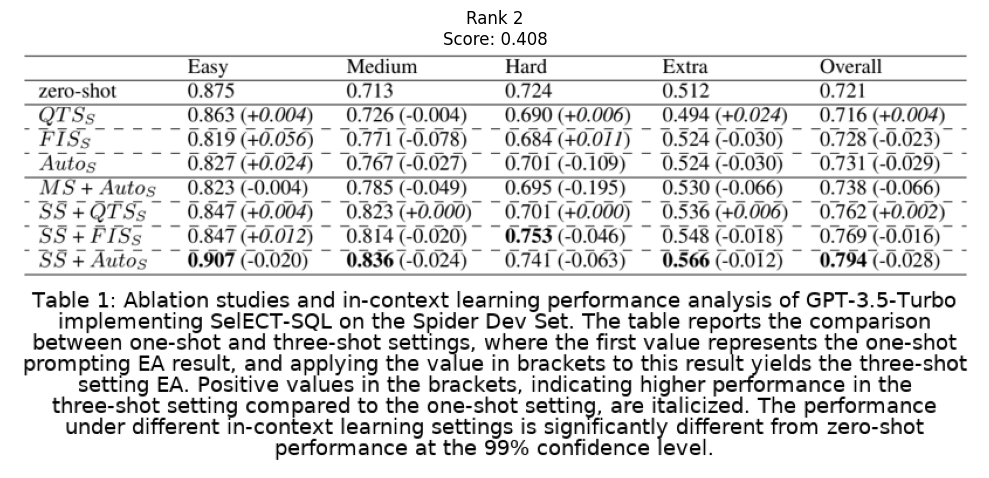

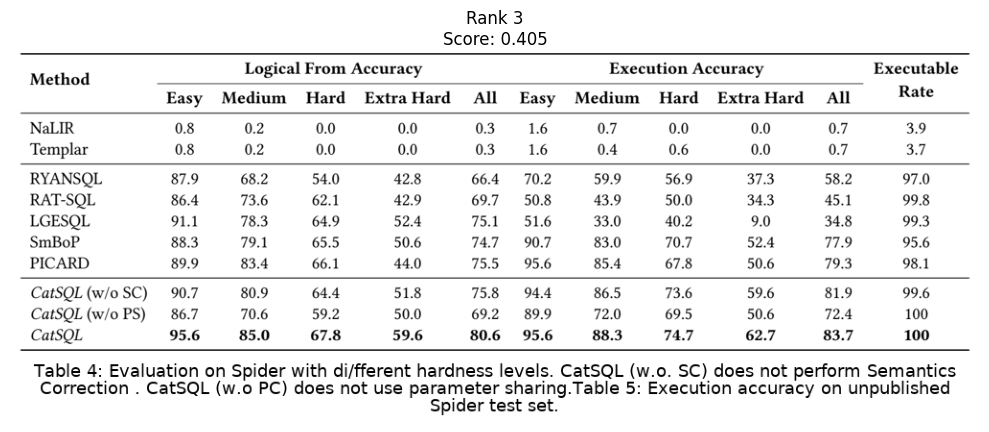

Results from CLIP_markdown


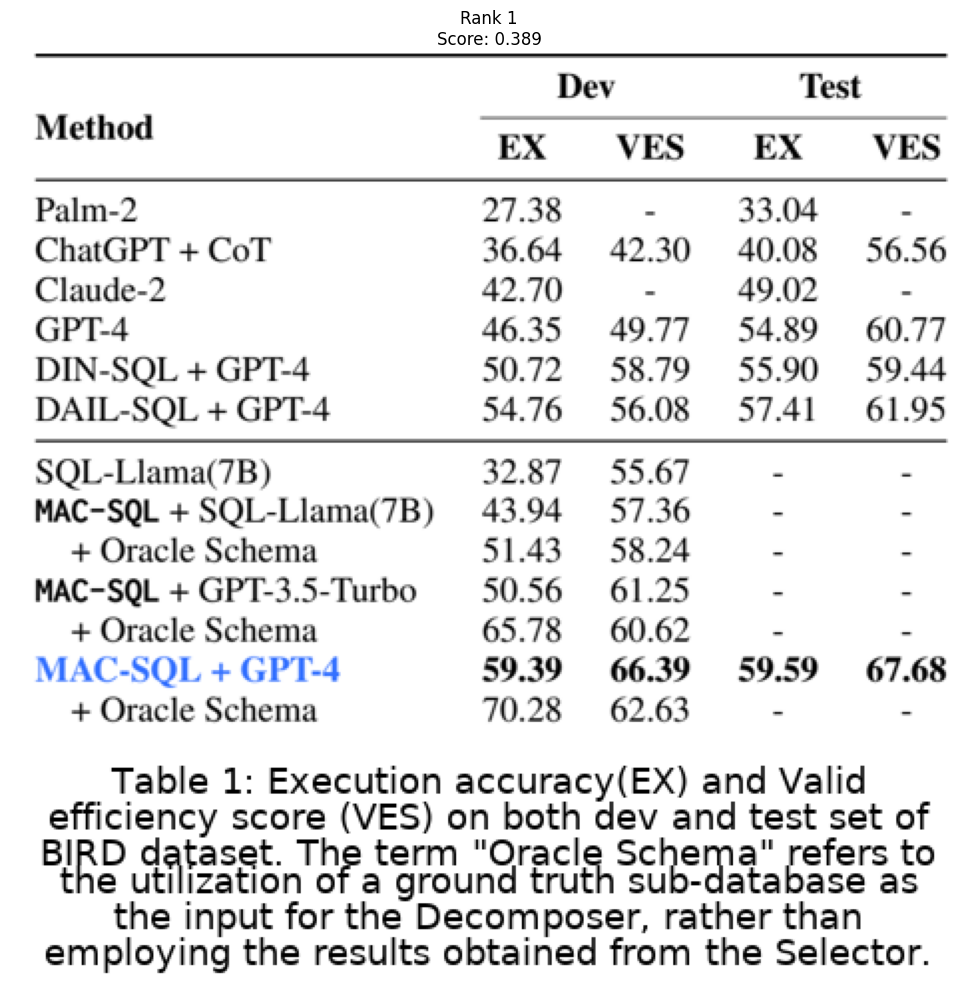

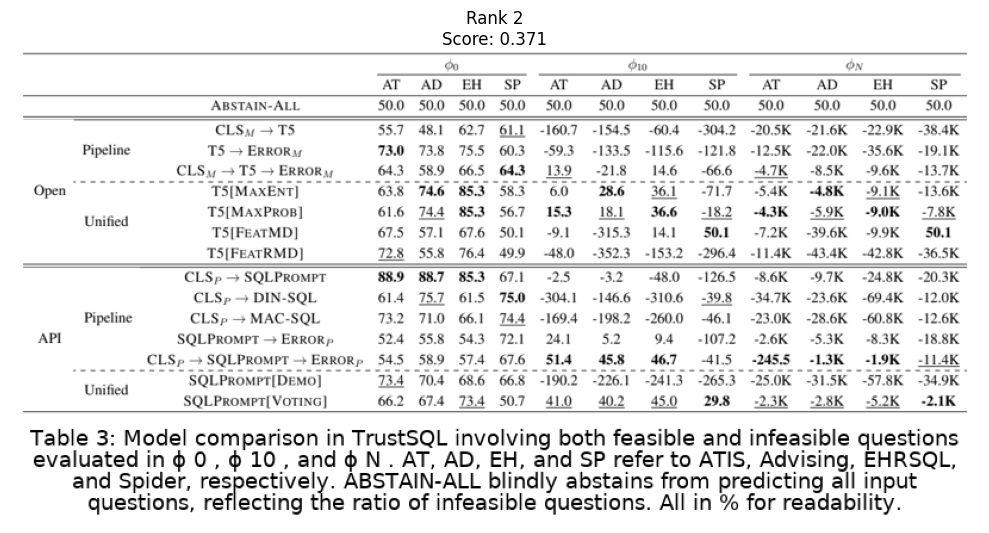

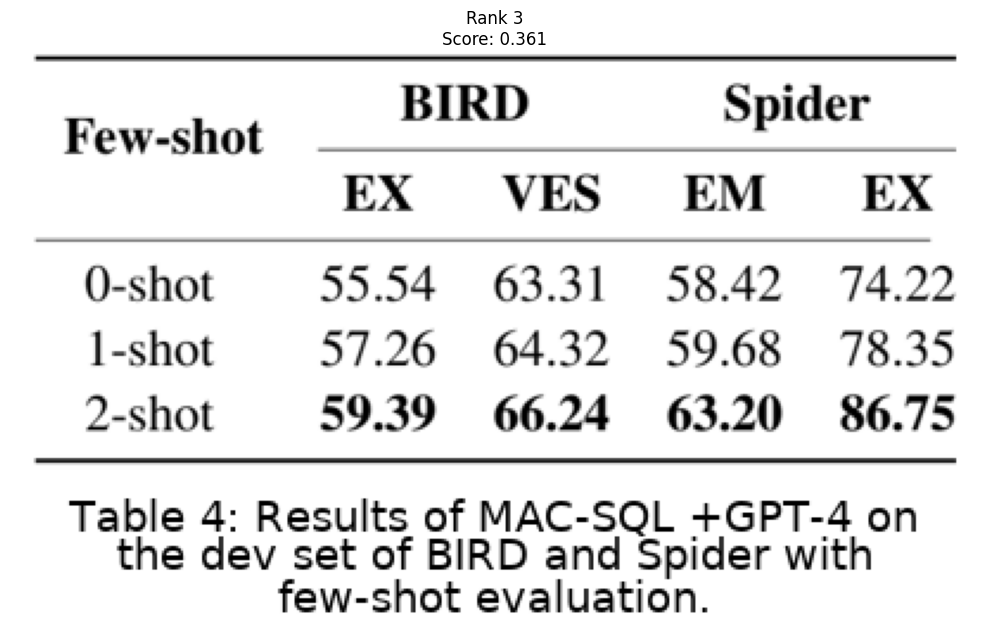

Results from ResNet_image


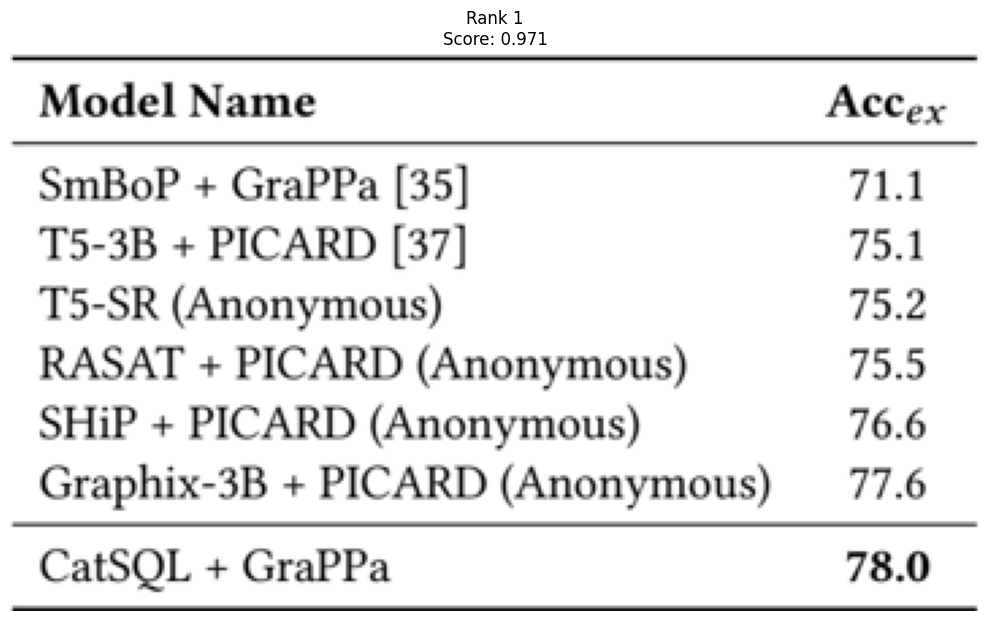

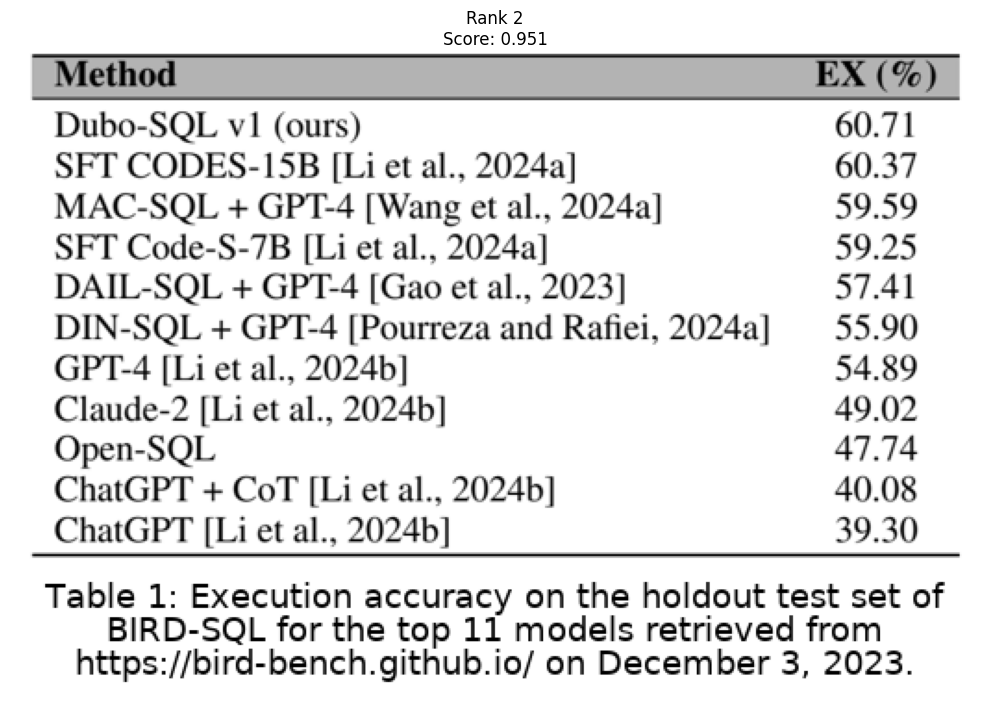

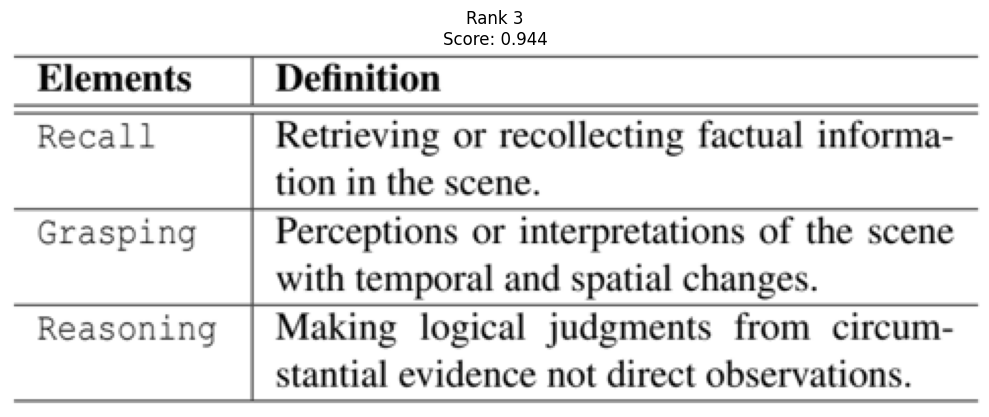

In [15]:
from IPython.display import display, HTML
from utils.ImageIndexer import visualize_results

def show_results(results):
    
    for method, matches in results.items():
        print(f"Results from {method}")
        visualize_results(matches,IMAGE_FOLDER)

show_results(search_results)

The results show that ColPali and CLIP when queried with the table image or table as markdown indeed retrieve text-to-SQL specific tables. ResNet, focuses more on the structure of the tables without the retrieved tables to be text-to-SQL specific. Querying CLIP and ColPali with the descriptions retrieved irrelevant tables and figures as well. However this may attributed a bit to the poor performance of Deepseek's Janus, lets try with Qwen as well. 

In [17]:
QUERY_PDF = './query.pdf'
QUERY_DATA = './query_data_qwen'
os.makedirs(QUERY_DATA, exist_ok=True)
document_handler_qwen = DocumentHandler()
query_result = document_handler_qwen.extract_images(
    pdf_path=QUERY_PDF,
    output_folder=QUERY_DATA,
    verbose=False,
    export_tables=True,
    export_figures=True,
    export_pages=False,
    do_ocr=True,
    do_table_structure=True,
    filter_irrelevant=True,
    add_caption=True,
    generate_metadata=True,
    generate_annotated_pdf=True,
    generate_descriptions=True,
    description_model="qwen",
    generate_table_markdown=True,
    relevant_passages=2
)

Loading checkpoint shards: 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /home/akouk/.cache/torch_extensions/py310_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared ob

This time we dont display the images bu we chose the same

In [19]:

with open(os.path.join(QUERY_DATA, 'metadata.json')) as f:
    query_metadata = json.load(f)

# Get user selection
selected_idx = int(input("\nEnter image number to search: ")) - 1
selected_item = query_metadata[selected_idx]

We will use the same image for retrieval, this time we will just try CLIP and ColPali with the description, since the results for the markdown based retrieval and the iamge based retrieval will not change. 

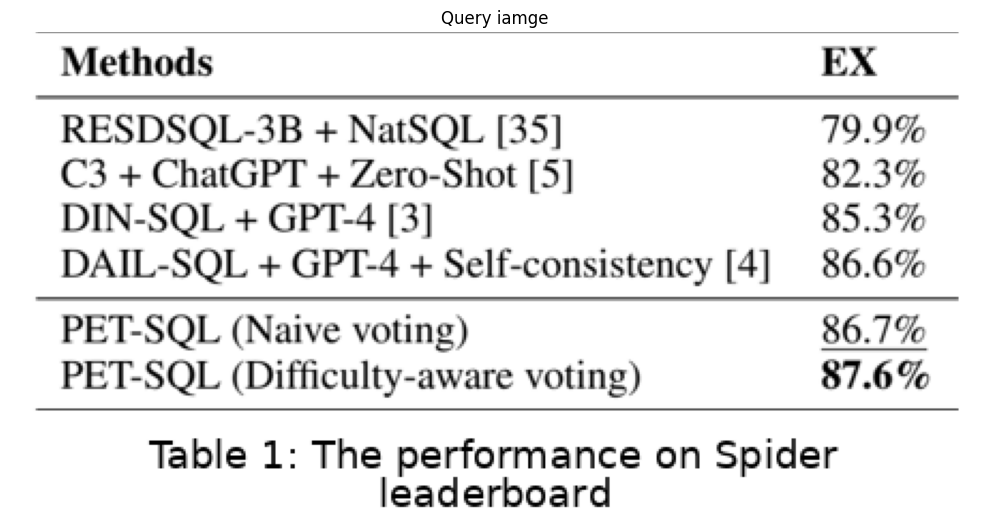

In [20]:
import matplotlib.pyplot as plt
from PIL import Image

query_image = os.path.join(QUERY_DATA, selected_item['filename'])
plt.figure(figsize=(10, 10))  # Adjust size as needed
plt.imshow(Image.open(query_image))
plt.title(f"Query iamge")
plt.axis('off')
plt.tight_layout()

In [21]:
def perform_comprehensive_search(query_item):
    results = {}
    results['ColPali_description'] = search_similar(None, 'colpali', 'text', str(query_item['description']))
    results['CLIP_description'] = search_similar(None, 'clip', 'text', query_item['description'])

            
    return results

In [22]:
search_results = perform_comprehensive_search(selected_item)

Results from ColPali_description


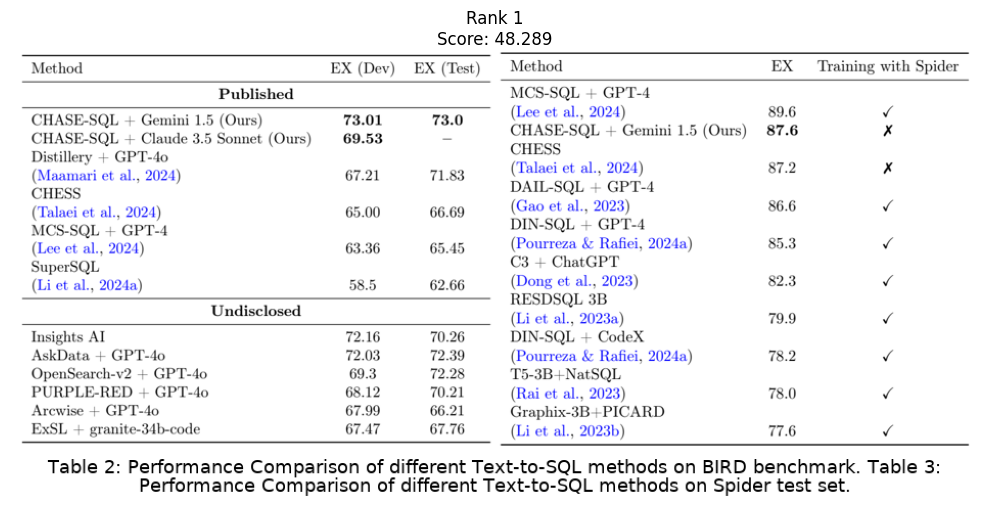

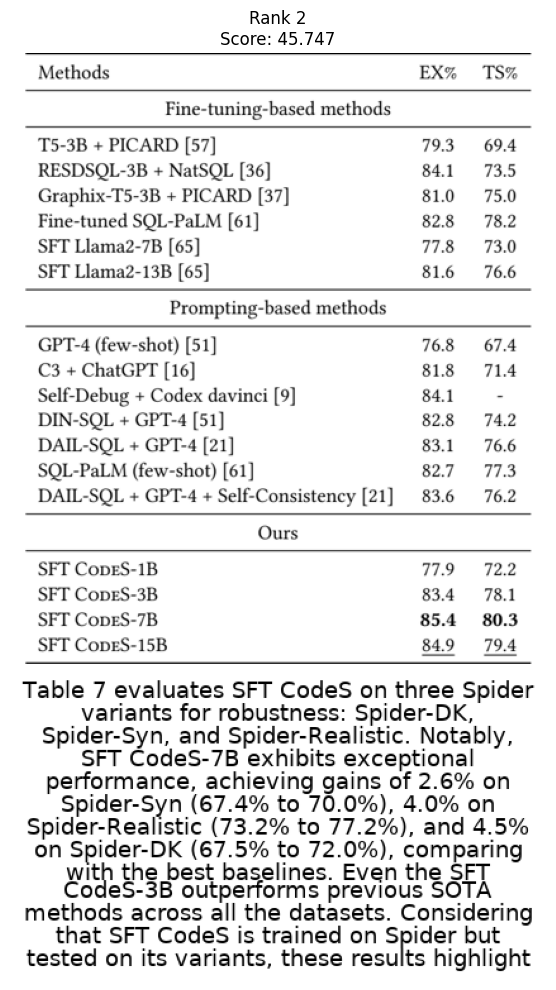

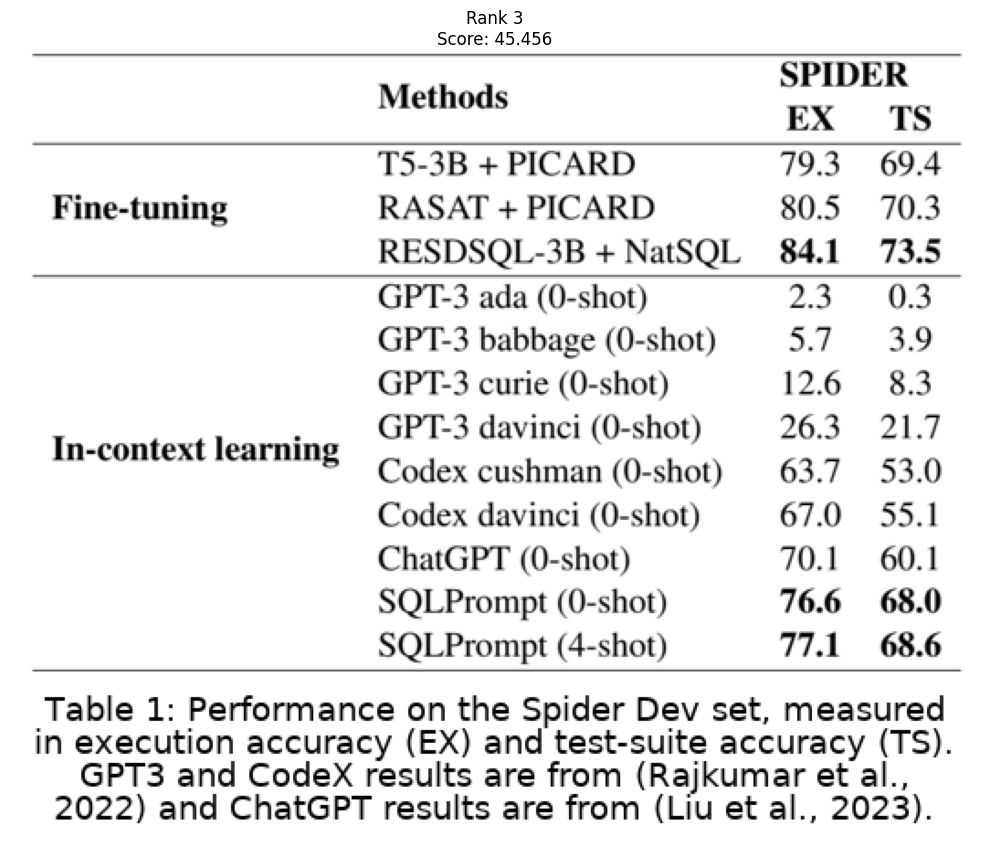

Results from CLIP_description


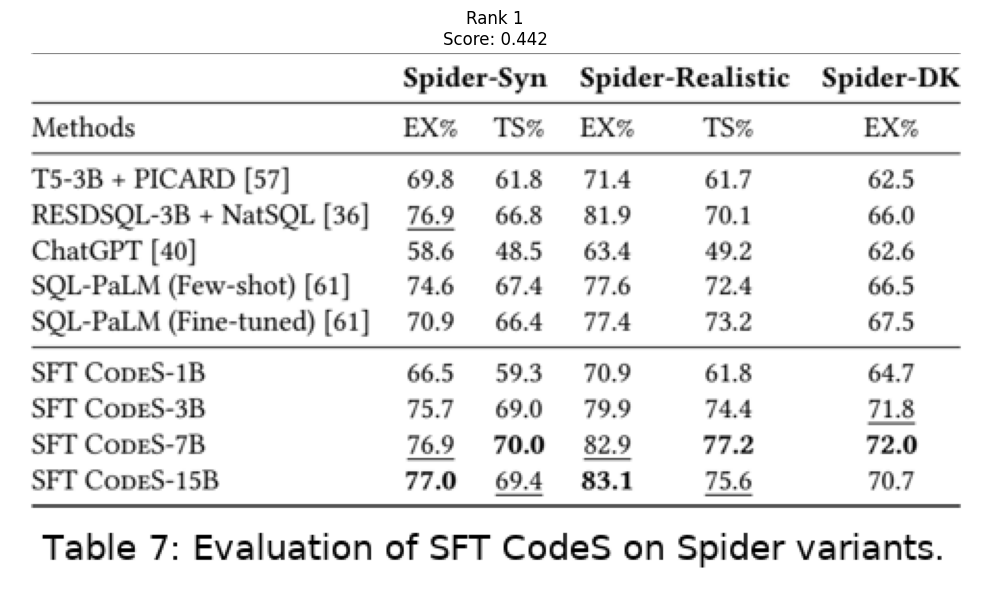

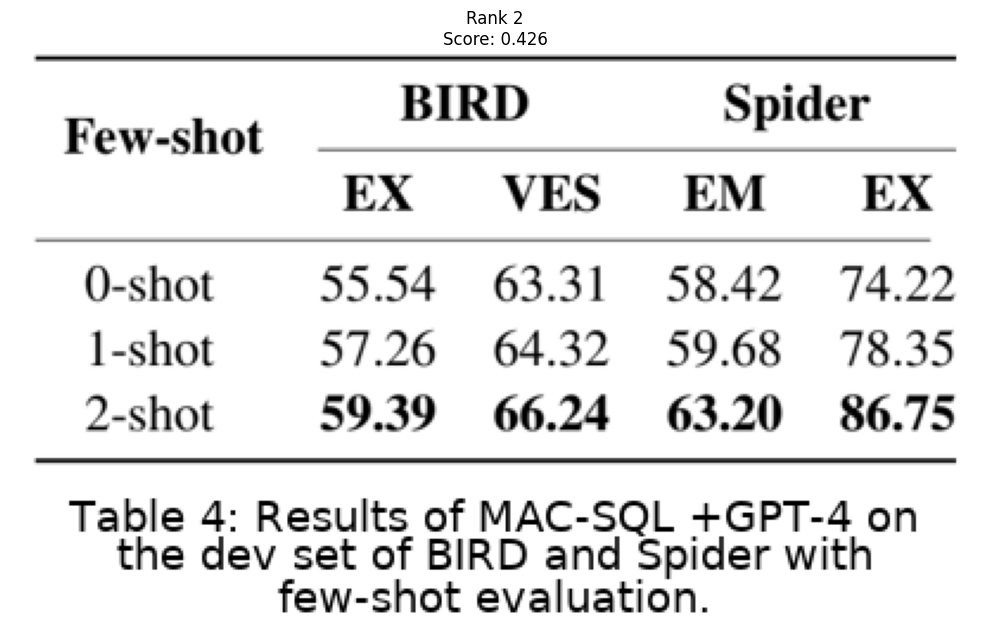

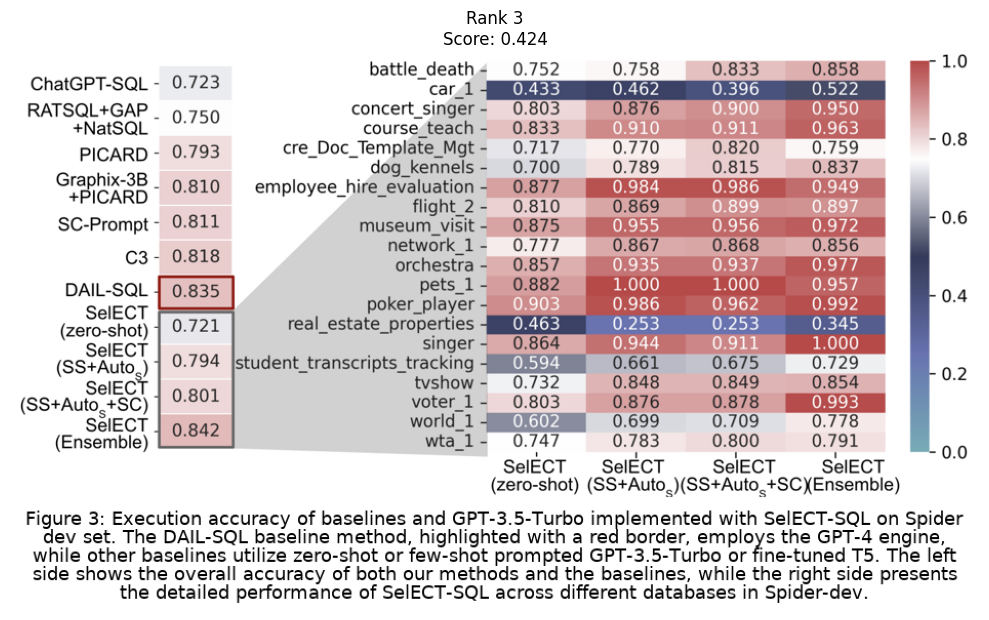

In [23]:
from IPython.display import display, HTML
from utils.ImageIndexer import visualize_results

def show_results(results):
    
    for method, matches in results.items():
        print(f"Results from {method}")
        visualize_results(matches,IMAGE_FOLDER)

show_results(search_results)

As we see with the results of qwen, the description based retrieval works fine, or at least returns text-to-SQL relevant images. 